<a href="https://colab.research.google.com/github/chima-BI/Churn-detection/blob/main/Churn_detection_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import plot_precision_recall_curve
from sklearn.model_selection import learning_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score,recall_score,precision_score,roc_auc_score,f1_score
from collections import Counter
import plotly.graph_objects as go
pd.set_option('max_columns', None)

In [ ]:
data=pd.read_csv("/content/Churn.csv")

In [ ]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
data.columns.values

array(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges',
       'TotalCharges', 'Churn'], dtype=object)

In [ ]:
data.shape

(7043, 21)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [ ]:
data['TotalCharges']=pd.to_numeric(data['TotalCharges'],errors='coerce')

In [ ]:
def find_categorical(data):
  categorical_features=[]
  for feature in data.columns.values:
    if len(data[feature].unique())<=10:
        categorical_features.append(feature)
  return categorical_features
def cast_categorical(categorical_features):
  for feature in categorical_features:
    data[feature]=data[feature].astype('category')

In [ ]:
cast_categorical(find_categorical(data))

In [ ]:
data.dtypes

customerID            object
gender              category
SeniorCitizen       category
Partner             category
Dependents          category
tenure                 int64
PhoneService        category
MultipleLines       category
InternetService     category
OnlineSecurity      category
OnlineBackup        category
DeviceProtection    category
TechSupport         category
StreamingTV         category
StreamingMovies     category
Contract            category
PaperlessBilling    category
PaymentMethod       category
MonthlyCharges       float64
TotalCharges         float64
Churn               category
dtype: object

In [ ]:
for column in data.select_dtypes(include='category').columns.values:
  print(f'{column}: {data[column].unique()}\n')

gender: ['Female', 'Male']
Categories (2, object): ['Female', 'Male']

SeniorCitizen: [0, 1]
Categories (2, int64): [0, 1]

Partner: ['Yes', 'No']
Categories (2, object): ['No', 'Yes']

Dependents: ['No', 'Yes']
Categories (2, object): ['No', 'Yes']

PhoneService: ['No', 'Yes']
Categories (2, object): ['No', 'Yes']

MultipleLines: ['No phone service', 'No', 'Yes']
Categories (3, object): ['No', 'No phone service', 'Yes']

InternetService: ['DSL', 'Fiber optic', 'No']
Categories (3, object): ['DSL', 'Fiber optic', 'No']

OnlineSecurity: ['No', 'Yes', 'No internet service']
Categories (3, object): ['No', 'No internet service', 'Yes']

OnlineBackup: ['Yes', 'No', 'No internet service']
Categories (3, object): ['No', 'No internet service', 'Yes']

DeviceProtection: ['No', 'Yes', 'No internet service']
Categories (3, object): ['No', 'No internet service', 'Yes']

TechSupport: ['No', 'Yes', 'No internet service']
Categories (3, object): ['No', 'No internet service', 'Yes']

StreamingTV: ['No

In [ ]:
data=data.drop(['customerID'],axis=1)

In [ ]:
data.isnull().sum()

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [ ]:
data=data.dropna()

In [ ]:
data['SeniorCitizen']=data['SeniorCitizen'].map({0:'No',1:'Yes'})

In [ ]:
data.describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


In [ ]:
def distribution(categorical_feature):
    data[categorical_feature].value_counts(normalize=True).plot(kind='pie',autopct='%.1f%%')
    plt.title(f'Distribution of customers according to {categorical_feature}')
    plt.legend()
    plt.show()

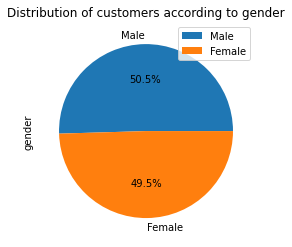

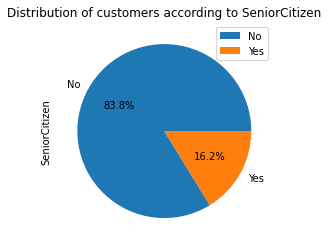

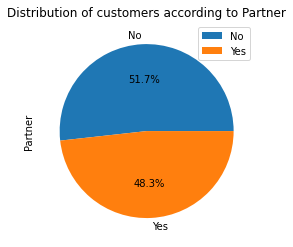

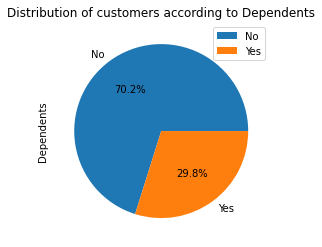

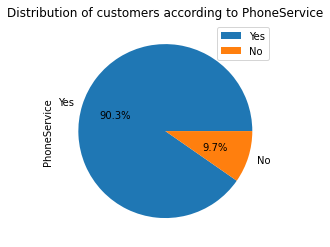

...

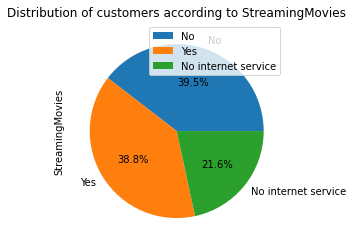

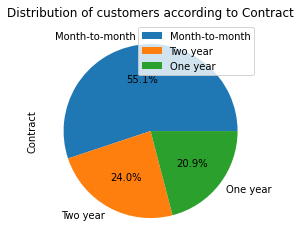

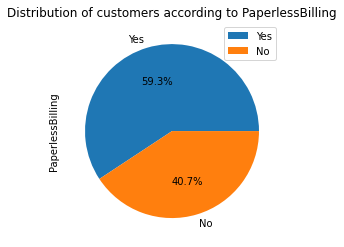

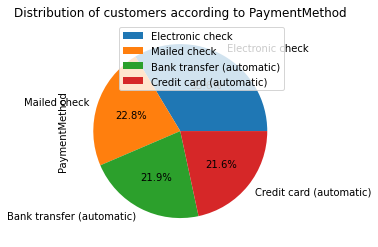

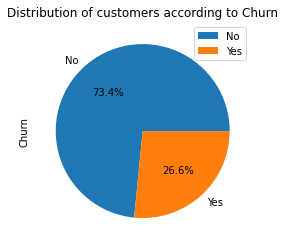

In [ ]:
for column in data.select_dtypes(include='category').columns.values:
  distribution(column)

In [ ]:
def plot_bar(categorical_feature):
    churn=data[data['Churn']=='Yes'][categorical_feature].value_counts()
    no_churn=data[data['Churn']=='No'][categorical_feature].value_counts()
    total_data=pd.DataFrame([churn,no_churn])
    total_data.index=['churn','no_churn']
    total_data.plot(kind='bar',stacked=True)
    plt.title(f'Churn distribution according to {categorical_feature}')
    plt.show()

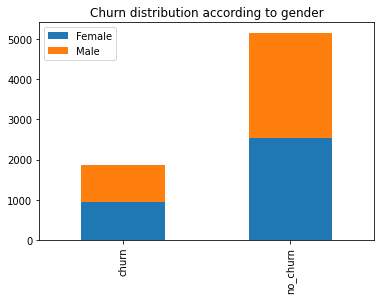

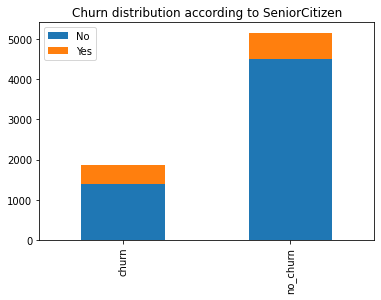

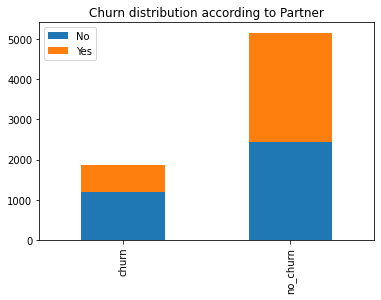

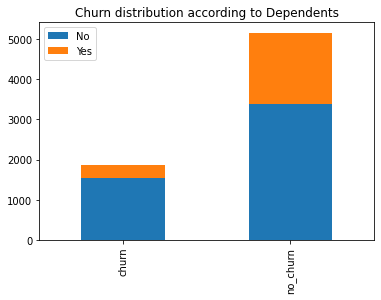

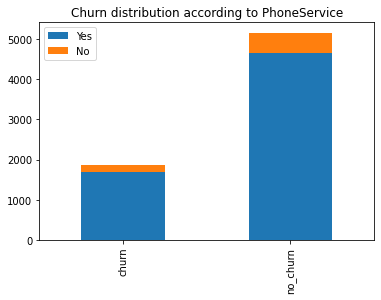

...

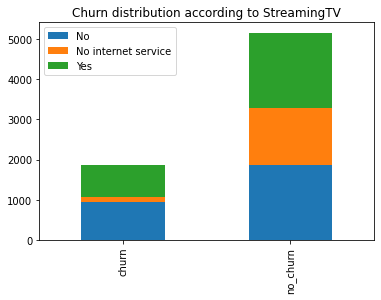

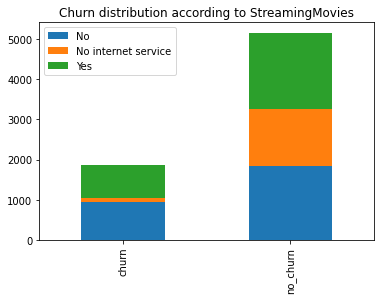

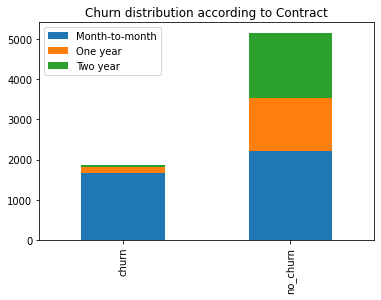

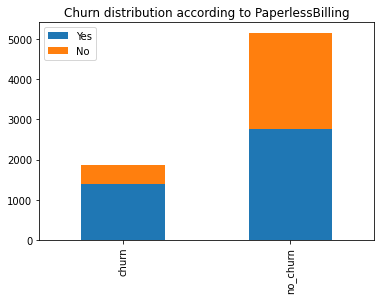

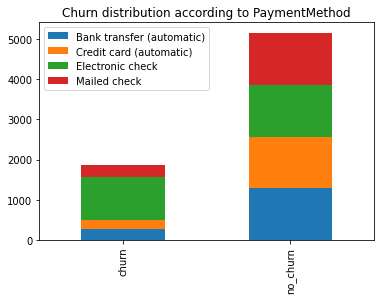

In [ ]:
for column in data.drop(['Churn'],axis=1).select_dtypes(include='category').columns.values:
  plot_bar(column)

In [ ]:
def box_plot(numerical_variable):
  sns.boxplot(x='Churn',y=numerical_variable,data=data)

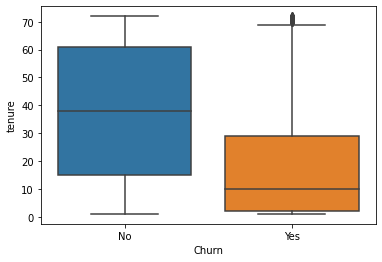

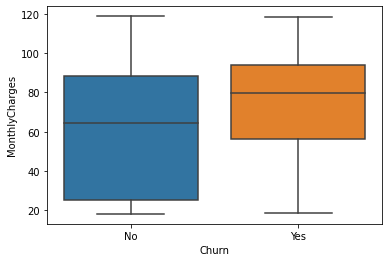

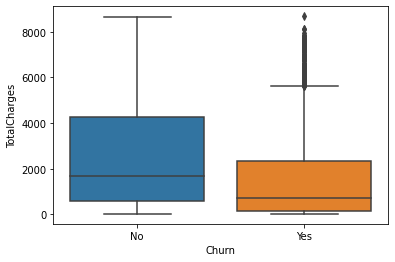

In [ ]:
for column in data.select_dtypes(include='number').columns.values:
  box_plot(column)
  plt.show()

In [ ]:
def distribution_plot(numerical_variable):
  sns.distplot(data[numerical_variable])
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



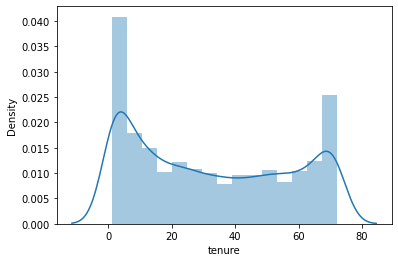

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



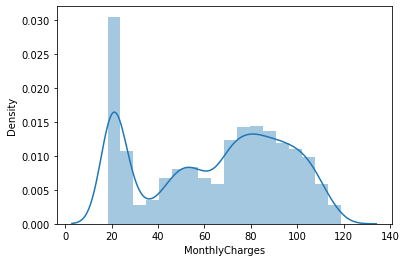

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



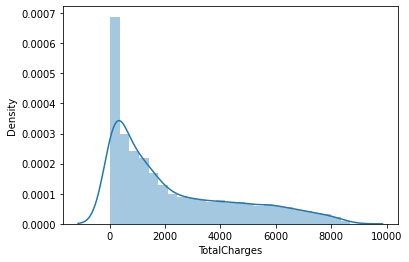

In [ ]:
for column in data.select_dtypes(include='number').columns.values:
  distribution_plot(column)

In [ ]:
def violin_plot(numerical_variable,categorical_variable):
    ax = sns.violinplot(x=categorical_variable, y=numerical_variable, hue="Churn", data=data,split=True)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    ax.set_title(f'Distribution of {numerical_variable} per {categorical_variable}', fontsize=16)
    plt.show()

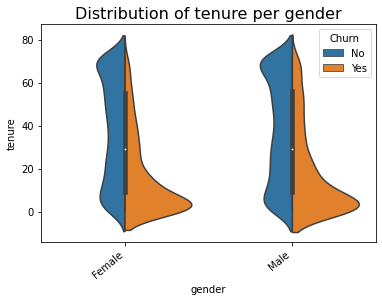

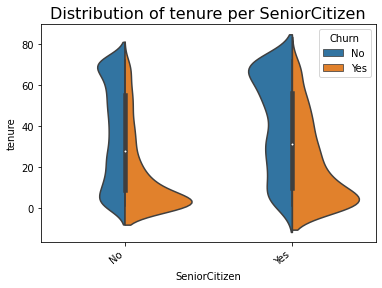

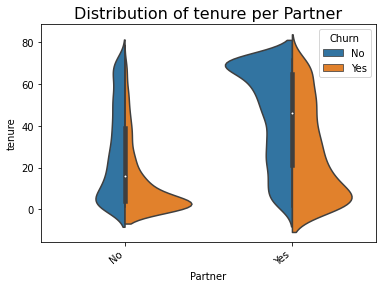

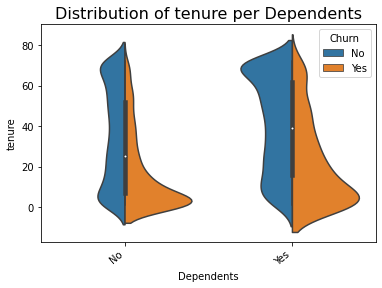

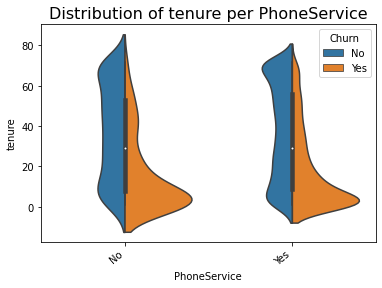

...

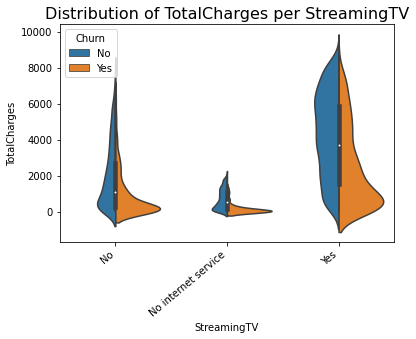

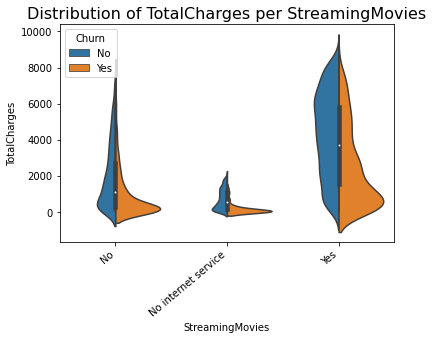

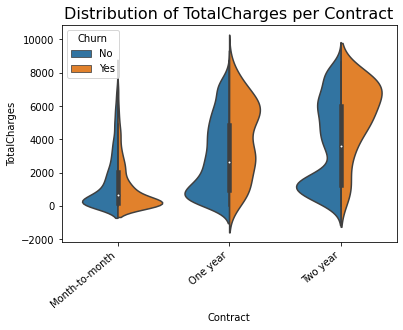

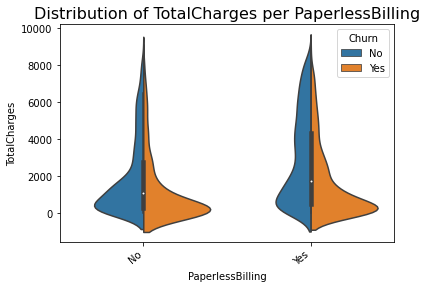

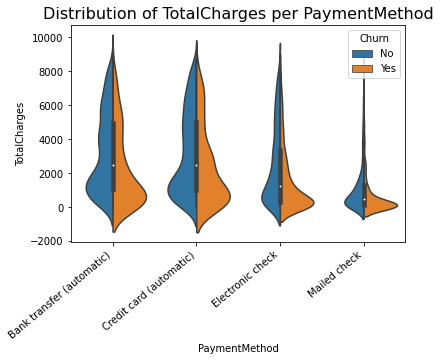

In [ ]:
for numerical_variable in data.select_dtypes(include='number').columns.values:
  for categorical_variable in data.drop(['Churn'],axis=1).select_dtypes(include='category').columns.values:
    violin_plot(numerical_variable,categorical_variable)

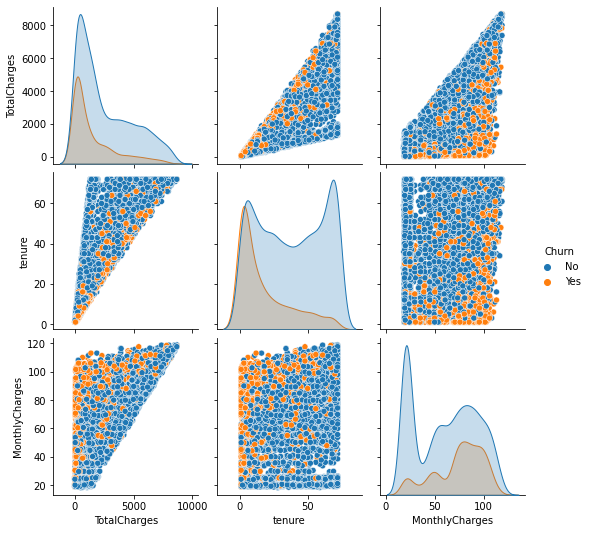

In [ ]:
sns.pairplot(data[['Churn','TotalCharges','tenure','MonthlyCharges']],hue='Churn')

In [ ]:
def cat_plot(numerical_variable,categorical_variable):
    cat = sns.catplot(x=categorical_variable,y=numerical_variable,data=data,hue='Churn')
    [plt.setp(ax.get_xticklabels(), rotation=90) for ax in cat.axes.flat]
    plt.show()

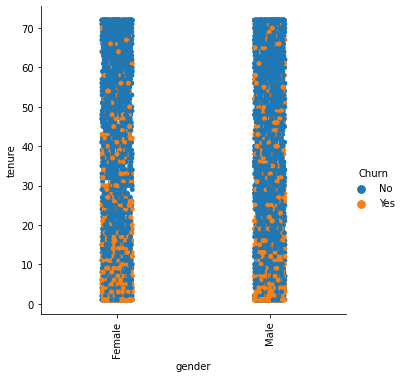

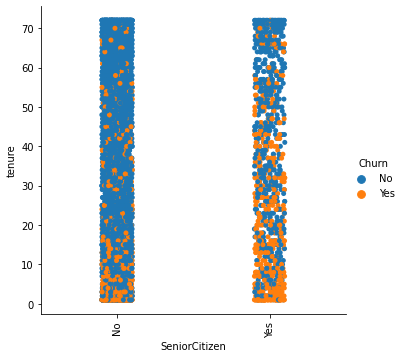

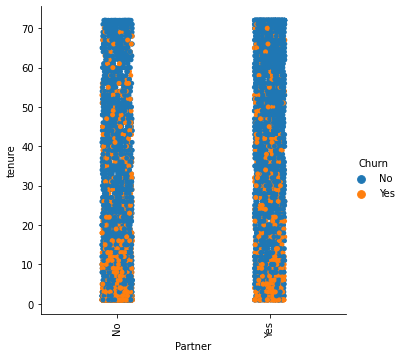

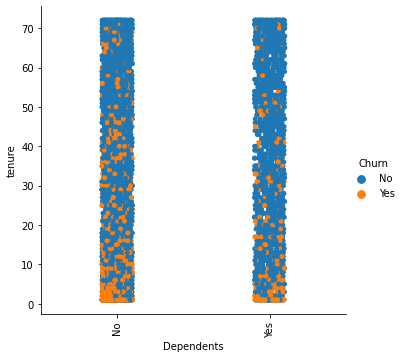

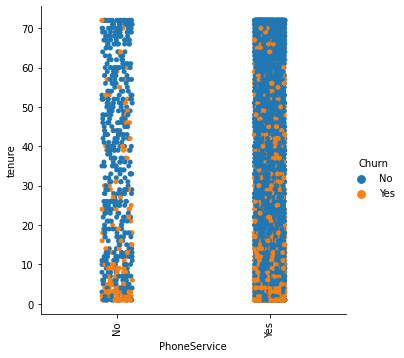

...

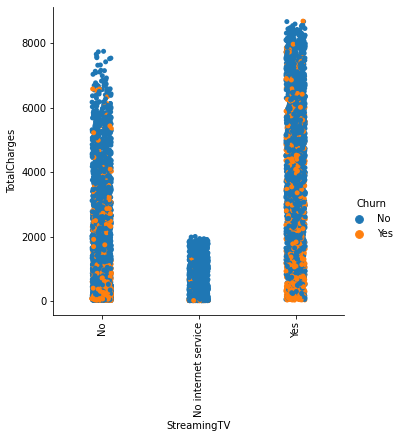

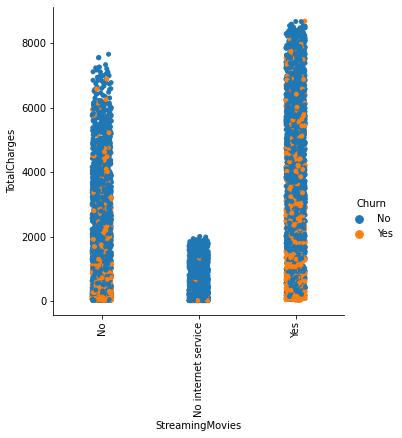

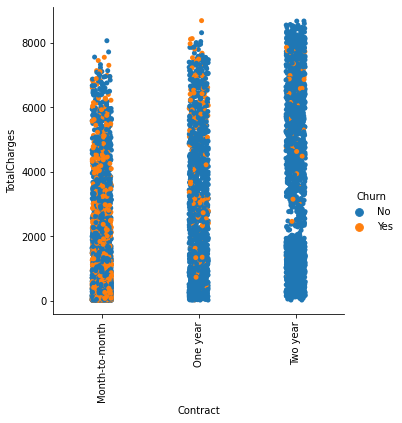

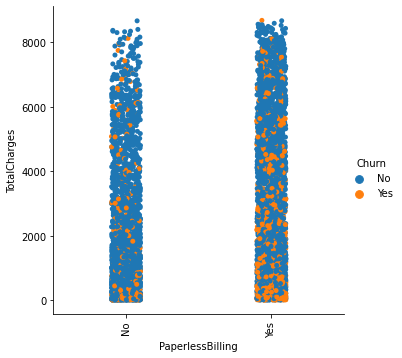

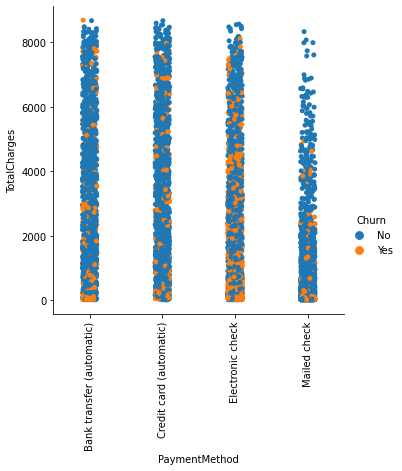

In [ ]:
for numerical_variable in data.select_dtypes(include='number').columns.values:
  for categorical_variable in data.drop(['Churn'],axis=1).select_dtypes(include='category').columns.values:
    cat_plot(numerical_variable,categorical_variable)

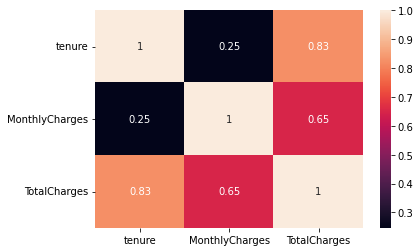

In [ ]:
sns.heatmap(data.select_dtypes(include='number').corr(),annot=True)

In [ ]:
data['Churn']=data['Churn'].map({'Yes':1,'No':0})

In [ ]:
X=data.drop(['Churn'],axis=1)
y=data['Churn']

In [ ]:
X=pd.get_dummies(X,prefix=X.select_dtypes(exclude='number').columns.values)

In [ ]:
X.head()

,tenure,MonthlyCharges,TotalCharges,gender_Female,gender_Male,SeniorCitizen_No,SeniorCitizen_Yes,Partner_No,Partner_Yes,Dependents_No,Dependents_Yes,PhoneService_No,PhoneService_Yes,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaperlessBilling_No,PaperlessBilling_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1,29.85,29.85,1,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0
1,34,56.95,1889.50,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1
2,2,53.85,108.15,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1
3,45,42.30,1840.75,0,1,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,0,0
4,2,70.70,151.65,1,0,1,0,1,0,1,0,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0


In [ ]:
X.shape

(7032, 46)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,stratify=y)

In [ ]:
numeric_columns=X.select_dtypes(include='number').columns
transformers = [('standard_scaler', StandardScaler(), numeric_columns)]
columns_transformer = ColumnTransformer(transformers, remainder='passthrough')
X_train=columns_transformer.fit_transform(X_train)
X_test=columns_transformer.transform(X_test)

In [ ]:
def telecom_churn_pediction(model,X_train,y_train,X_test,y_test,cv):
    model.fit(X_train,y_train)
    print(f"Model recall score on validation data: {round(cross_val_score(model,X_train,y_train,cv=cv,scoring='recall').mean(),2)}")
    print(f"Model f1-score on validation data: {round(cross_val_score(model,X_train,y_train,cv=cv,scoring='f1').mean(),2)}")
    y_predicted=model.predict(X_test)
    print(classification_report(y_test,y_predicted))
    print(f"Model roc auc score using test data: {round(roc_auc_score(y_test,y_predicted),2)}")
    sns.heatmap(data=confusion_matrix(y_test,y_predicted),annot=True,fmt="d",cmap='Blues').set(title="confusion matrix")
    plt.show()
    coefficients_importance=model.coef_[0]
    coefficients_importance=pd.Series(coefficients_importance,index=X.columns.values).sort_values(ascending=False)[:10]
    coefficients_importance.plot(kind='barh')
    plt.show()
    plot_precision_recall_curve(model,X_test,y_test)
    plot_roc_curve(model, X_test, y_test)
    plt.show()
    N,train_score,val_score=learning_curve(model,X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=cv,scoring='f1')
    plt.plot(N,train_score.mean(axis=1),label='train')
    plt.plot(N,val_score.mean(axis=1),label='validation')
    plt.xlabel('taille du training set')
    plt.ylabel('f1 score')
    plt.legend()
    plt.show() 

def telecom_churn_pediction_tree(model,X_train,y_train,X_test,y_test,cv):
    model.fit(X_train,y_train)
    print(f"Model recall score on train data: {round(cross_val_score(model,X_train,y_train,cv=cv,scoring='recall').mean(),2)}")
    print(f"Model f1-score on train data: {round(cross_val_score(model,X_train,y_train,cv=cv,scoring='f1').mean(),2)}")
    y_predicted=model.predict(X_test)
    print(classification_report(y_test,y_predicted))
    print(f"Model roc auc score using test data: {round(roc_auc_score(y_test,y_predicted),2)}")
    sns.heatmap(data=confusion_matrix(y_test,y_predicted),annot=True,fmt="d",cmap='Blues').set(title="confusion matrix")
    plt.show()
    coefficients_importance=model.feature_importances_
    coefficients_importance=pd.Series(coefficients_importance,index=X.columns.values).sort_values(ascending=False)[:10]
    coefficients_importance.plot(kind='barh')
    plt.show()
    plot_precision_recall_curve(model,X_test,y_test)
    plot_roc_curve(model, X_test, y_test)
    plt.show()
    N,train_score,val_score=learning_curve(model,X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=cv,scoring='f1')
    plt.plot(N,train_score.mean(axis=1),label='train')
    plt.plot(N,val_score.mean(axis=1),label='validation')
    plt.xlabel('taille du training set')
    plt.ylabel('f1 score')
    plt.legend()
    plt.show() 

**Logistic Regression**

Model recall score on validation data: 0.55
Model f1-score on validation data: 0.6
              precision    recall  f1-score   support

           0       0.85      0.91      0.88      1033
           1       0.68      0.56      0.62       374

    accuracy                           0.81      1407
   macro avg       0.77      0.73      0.75      1407
weighted avg       0.81      0.81      0.81      1407

Model roc auc score using test data: 0.73


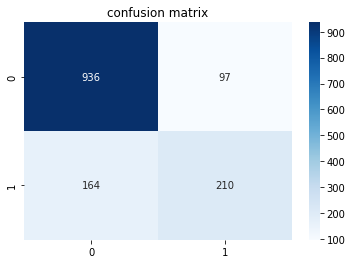

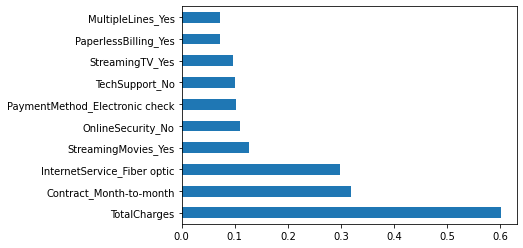

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



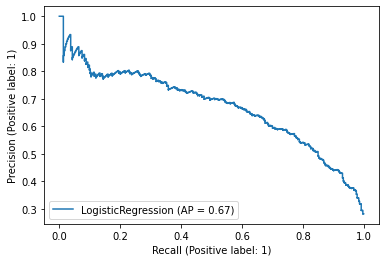

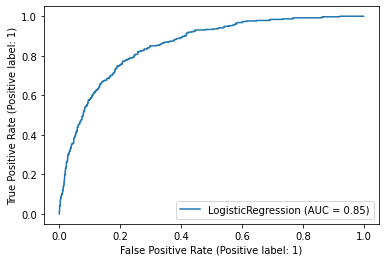

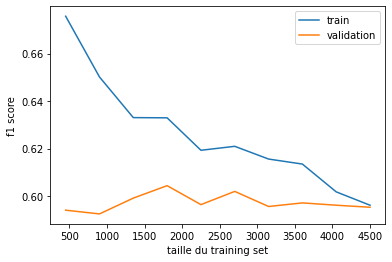

In [ ]:
logistic_regression=LogisticRegression(max_iter=300)
telecom_churn_pediction(logistic_regression,X_train,y_train,X_test,y_test,cv=StratifiedKFold(n_splits=5))

**Decision trees without pruning**:

Model recall score on train data: 0.51
Model f1-score on train data: 0.5
              precision    recall  f1-score   support

           0       0.81      0.80      0.81      1033
           1       0.48      0.49      0.48       374

    accuracy                           0.72      1407
   macro avg       0.64      0.65      0.65      1407
weighted avg       0.72      0.72      0.72      1407

Model roc auc score using test data: 0.65


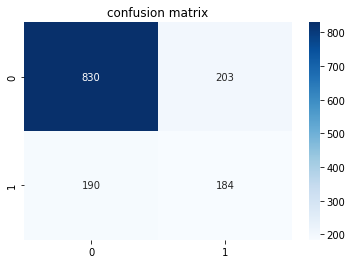

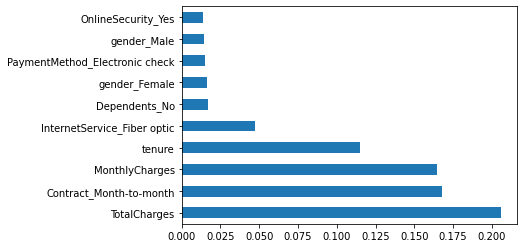

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



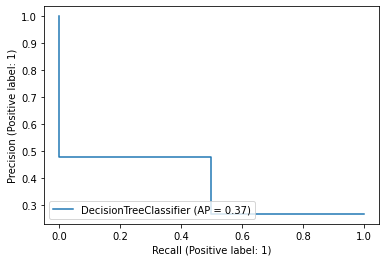

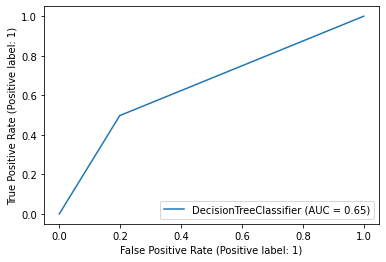

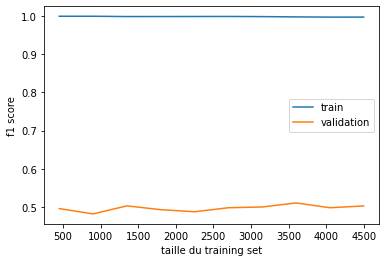

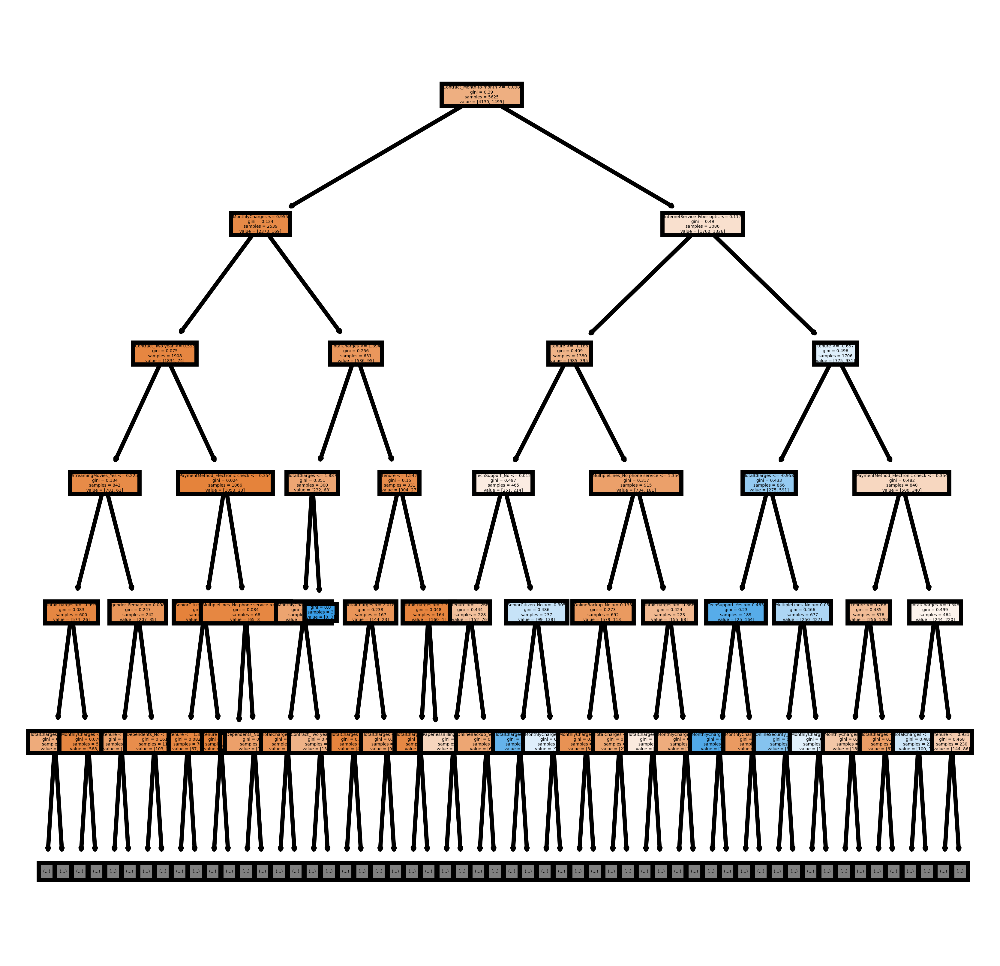

In [ ]:
full_tree=DecisionTreeClassifier()
telecom_churn_pediction_tree(full_tree,X_train,y_train,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(full_tree,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

**Decision tree with prepruning**

In [ ]:
full_tree.get_depth()

25

In [ ]:
grid=GridSearchCV(estimator=DecisionTreeClassifier(),scoring='f1',param_grid={'max_depth':[depth for depth in range(1,full_tree.get_depth()+1)]},cv=StratifiedKFold(n_splits=5))
grid.fit(X_train,y_train)
tree_prepruned=grid.best_estimator_
print("Best params: " ,grid.best_params_)
print("Best score: " ,grid.best_score_)

Best params:  {'max_depth': 6}
Best score:  0.585399470709157


Model recall score on train data: 0.56
Model f1-score on train data: 0.59
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      1033
           1       0.61      0.53      0.56       374

    accuracy                           0.78      1407
   macro avg       0.72      0.70      0.71      1407
weighted avg       0.78      0.78      0.78      1407

Model roc auc score using test data: 0.7


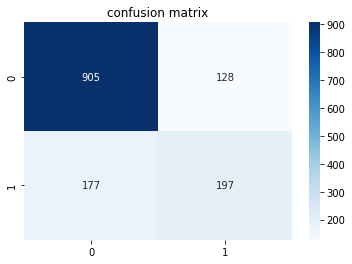

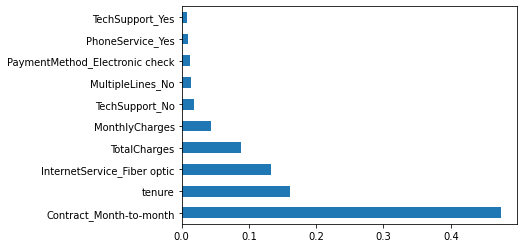

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



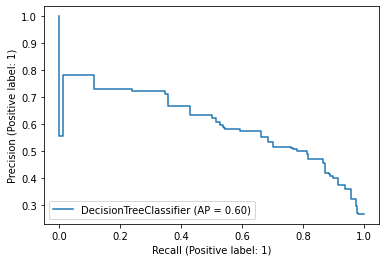

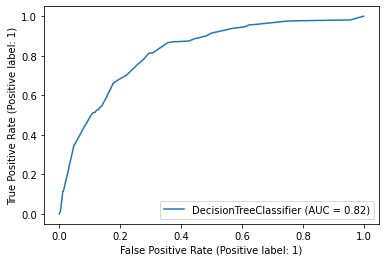

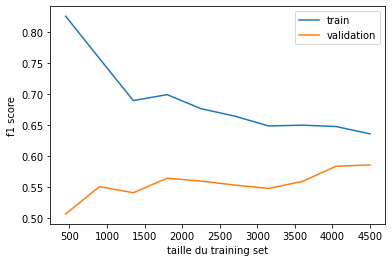

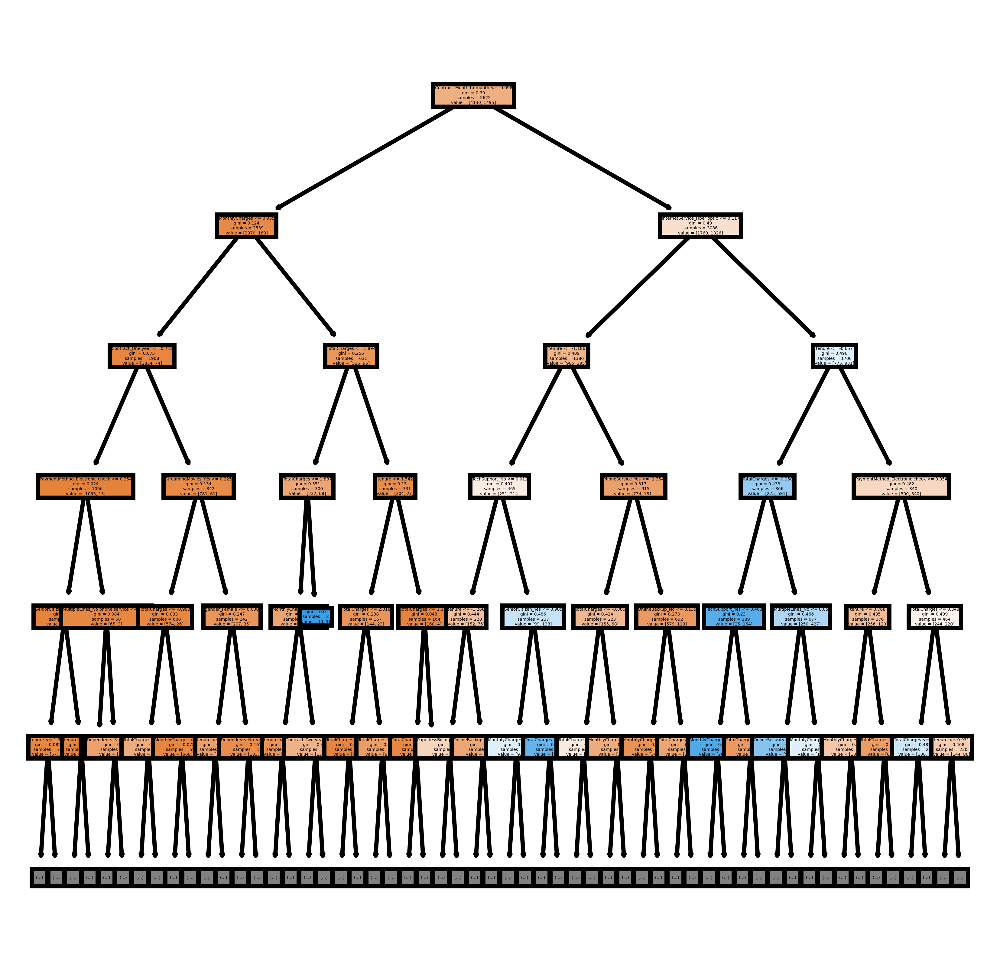

In [ ]:
tree_prepruned=grid.best_estimator_
telecom_churn_pediction_tree(tree_prepruned,X_train,y_train,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(tree_prepruned,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

**Decision tree with post pruning**:

In [ ]:
path = full_tree.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas= path["ccp_alphas"]
grid=GridSearchCV(estimator=DecisionTreeClassifier(),
                  scoring='f1',
                  param_grid={"ccp_alpha":[alpha for alpha in ccp_alphas]},
                  cv=StratifiedKFold(n_splits=5))
grid.fit(X_train,y_train)
print("Best params: ",grid.best_params_)
print("Best score: ",grid.best_score_)


Best params:  {'ccp_alpha': 0.0006893811544271775}
Best score:  0.5809127376787517


Depth:  8
Model recall score on train data: 0.54
Model f1-score on train data: 0.58
              precision    recall  f1-score   support

           0       0.82      0.89      0.85      1033
           1       0.60      0.48      0.53       374

    accuracy                           0.78      1407
   macro avg       0.71      0.68      0.69      1407
weighted avg       0.76      0.78      0.77      1407

Model roc auc score using test data: 0.68


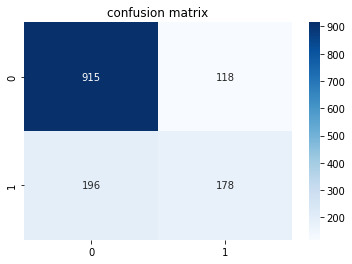

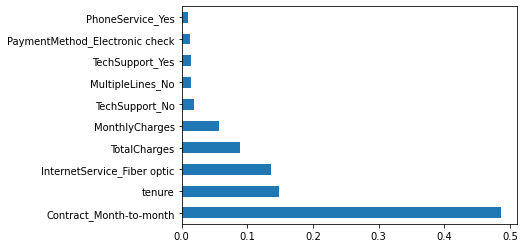

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



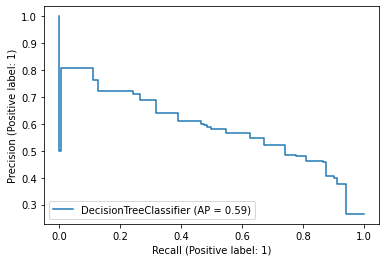

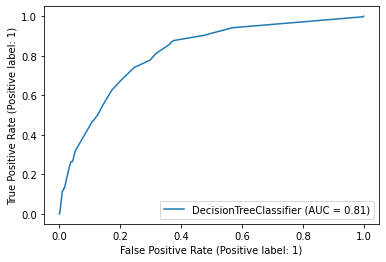

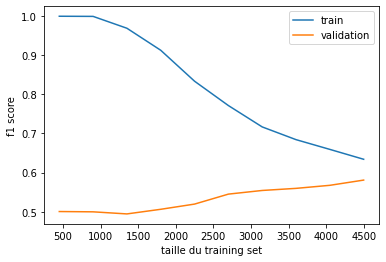

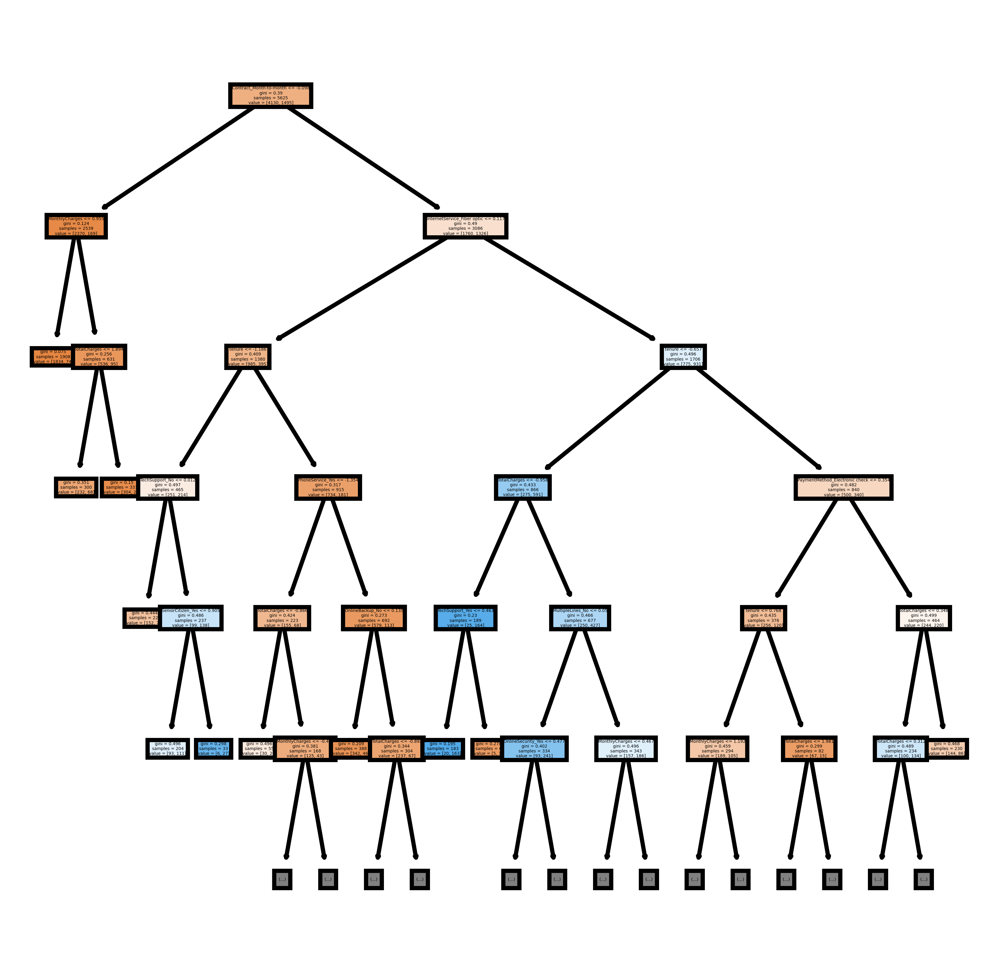

In [ ]:
tree_postpruned=grid.best_estimator_
print("Depth: ",tree_postpruned.get_depth())
telecom_churn_pediction_tree(tree_postpruned,X_train,y_train,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(tree_postpruned,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

Model recall score on train data: 0.47
Model f1-score on train data: 0.54
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1033
           1       0.61      0.49      0.54       374

    accuracy                           0.78      1407
   macro avg       0.72      0.69      0.70      1407
weighted avg       0.77      0.78      0.77      1407

Model roc auc score using test data: 0.69


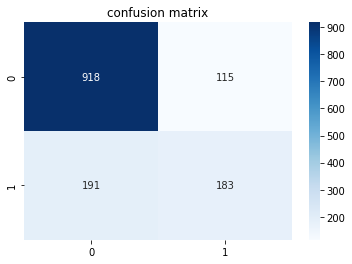

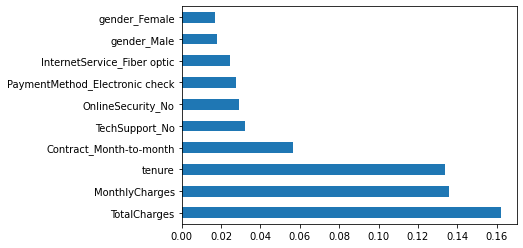

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



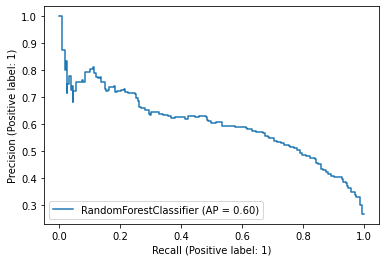

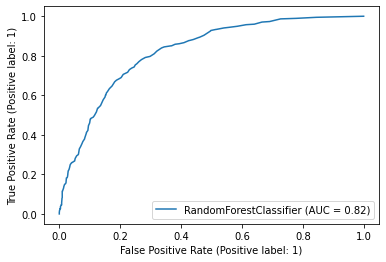

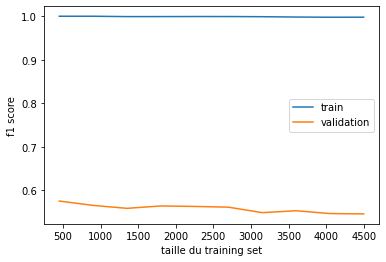

In [ ]:
random_forest=RandomForestClassifier()
telecom_churn_pediction_tree(random_forest,X_train,y_train,X_test,y_test,cv=StratifiedKFold(n_splits=5))

##SMOTE##

In [ ]:
smote = SMOTE()
X_train_smote, y_train_smote= smote.fit_resample(X_train, y_train)
print(f'Resampled dataset samples per class {Counter(y_train_smote)}')

Resampled dataset samples per class Counter({0: 4130, 1: 4130})


**Logistic regression with smote**:

Model recall score on validation data: 0.82
Model f1-score on validation data: 0.78
              precision    recall  f1-score   support

           0       0.92      0.75      0.82      1033
           1       0.54      0.82      0.65       374

    accuracy                           0.77      1407
   macro avg       0.73      0.78      0.74      1407
weighted avg       0.82      0.77      0.78      1407

Model roc auc score using test data: 0.78


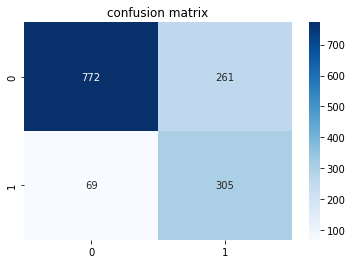

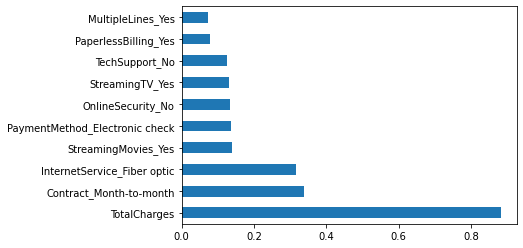

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



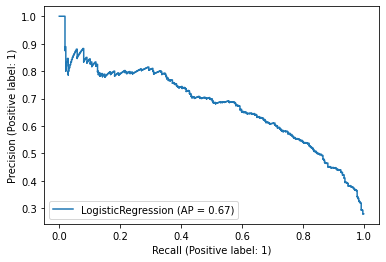

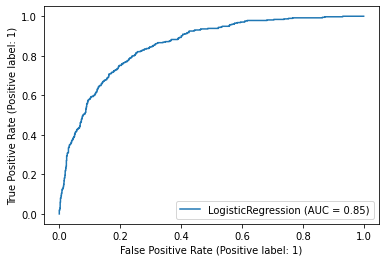

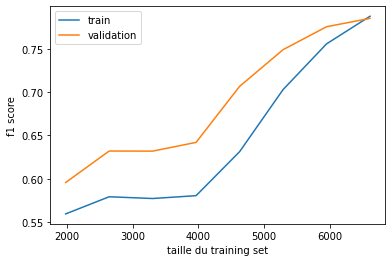

In [ ]:
logistic_regression_smote=LogisticRegression(max_iter=300)
telecom_churn_pediction(logistic_regression,X_train_smote,y_train_smote,X_test,y_test,cv=StratifiedKFold(n_splits=5))

**Decision tree without pruning with smote**:

Model recall score on train data: 0.78
Model f1-score on train data: 0.77
              precision    recall  f1-score   support

           0       0.83      0.78      0.80      1033
           1       0.48      0.54      0.51       374

    accuracy                           0.72      1407
   macro avg       0.65      0.66      0.66      1407
weighted avg       0.73      0.72      0.72      1407

Model roc auc score using test data: 0.66


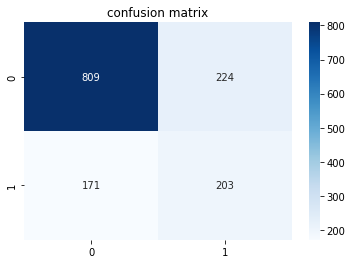

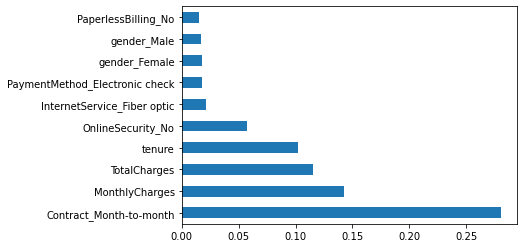

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



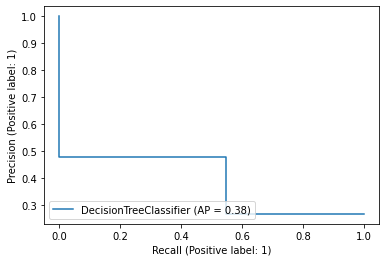

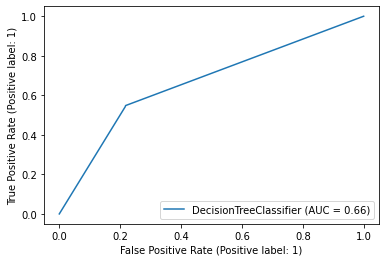

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.



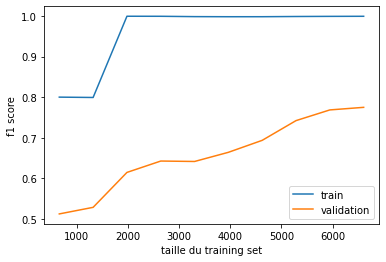

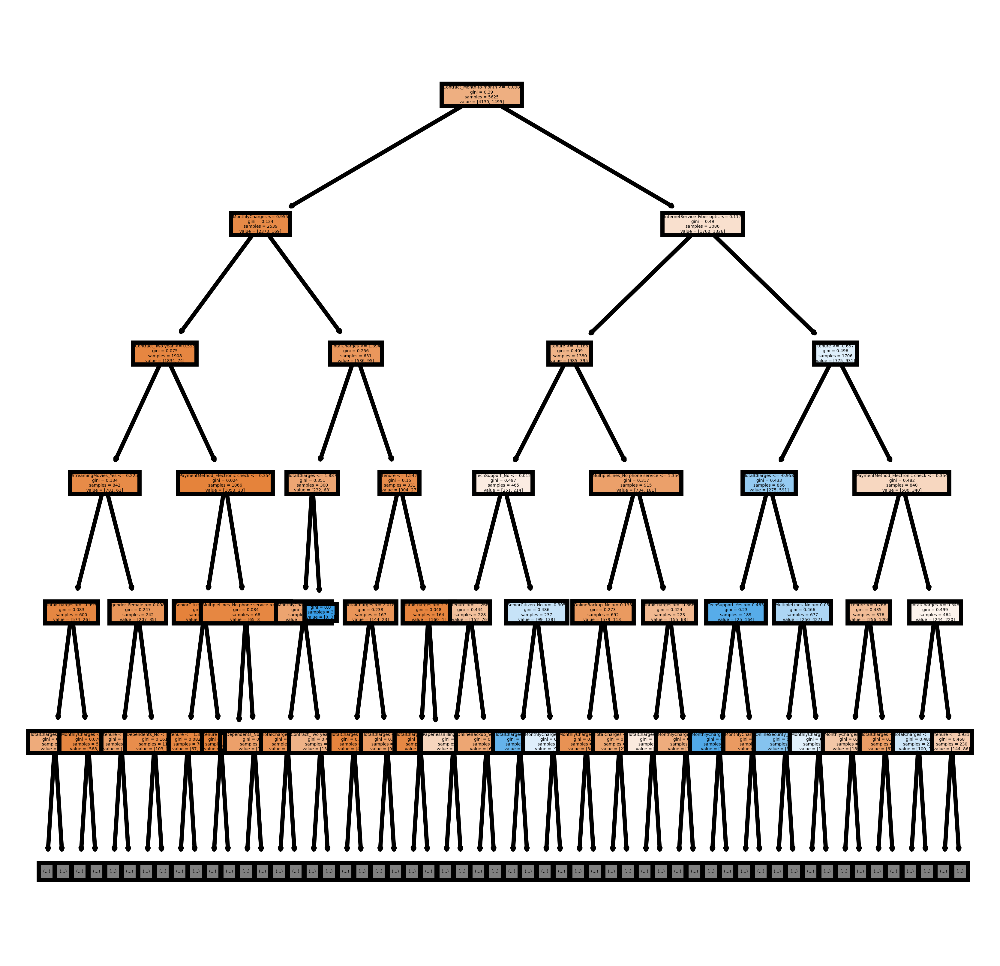

In [ ]:
full_tree_smote=DecisionTreeClassifier()
telecom_churn_pediction_tree(full_tree_smote,X_train_smote,y_train_smote,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(full_tree,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

**Descion tree with prepruning and smote**:

In [ ]:
full_tree_smote.get_depth()

28

In [ ]:
grid=GridSearchCV(estimator=DecisionTreeClassifier(),scoring='f1',param_grid={'max_depth':[depth for depth in range(1,full_tree.get_depth()+1)]},cv=StratifiedKFold(n_splits=5))
grid.fit(X_train_smote,y_train_smote)
tree_prepruned=grid.best_estimator_
print("Best params: " ,grid.best_params_)
print("Best score: " ,grid.best_score_)

Best params:  {'max_depth': 9}
Best score:  0.8037206922287892


Model recall score on train data: 0.83
Model f1-score on train data: 0.8
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1033
           1       0.52      0.67      0.59       374

    accuracy                           0.75      1407
   macro avg       0.69      0.72      0.70      1407
weighted avg       0.77      0.75      0.76      1407

Model roc auc score using test data: 0.72


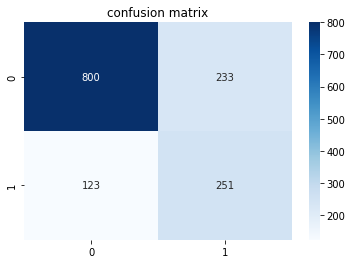

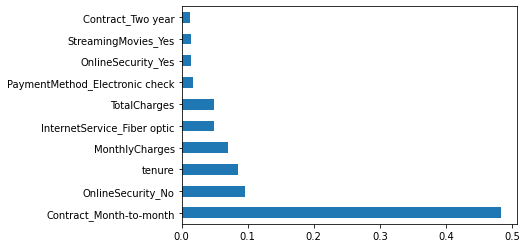

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



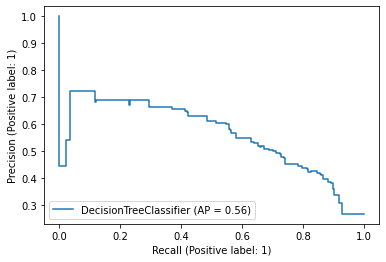

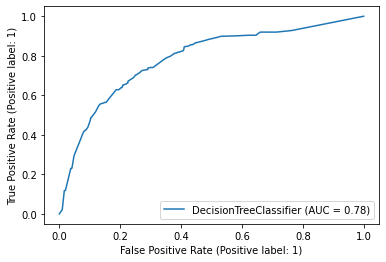

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.



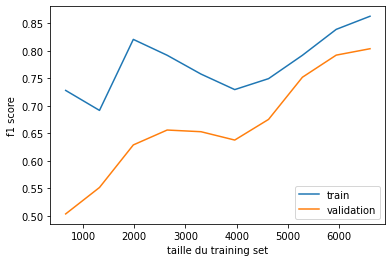

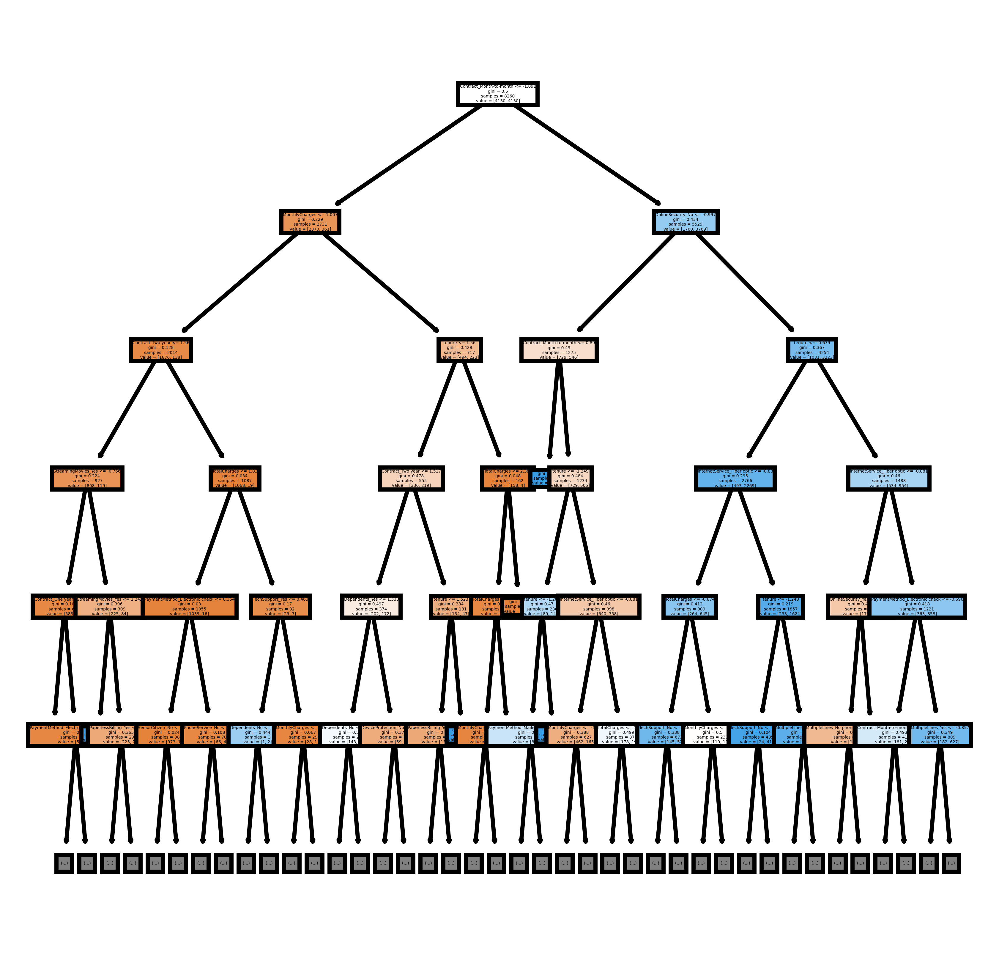

In [ ]:
tree_prepruned_smote=grid.best_estimator_
telecom_churn_pediction_tree(tree_prepruned_smote,X_train_smote,y_train_smote,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(tree_prepruned_smote,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

**Decision tree with post pruning and smote**:

In [ ]:
path= full_tree_smote.cost_complexity_pruning_path(X_train_smote, y_train_smote)
ccp_alphas= path["ccp_alphas"]
grid=GridSearchCV(estimator=DecisionTreeClassifier(),
                  scoring='f1',
                  param_grid={"ccp_alpha":[alpha for alpha in ccp_alphas]},
                  cv=StratifiedKFold(n_splits=5))
grid.fit(X_train_smote,y_train_smote)
print("Best params: ",grid.best_params_)
print("Best score: ",grid.best_score_)


Best params:  {'ccp_alpha': 0.0006079818189541658}
Best score:  0.7990812276707301


Depth:  8
Model recall score on train data: 0.83
Model f1-score on train data: 0.8
              precision    recall  f1-score   support

           0       0.88      0.77      0.82      1033
           1       0.53      0.71      0.61       374

    accuracy                           0.76      1407
   macro avg       0.71      0.74      0.72      1407
weighted avg       0.79      0.76      0.77      1407

Model roc auc score using test data: 0.74


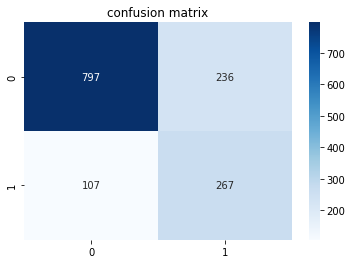

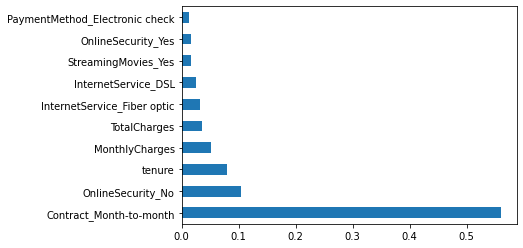

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



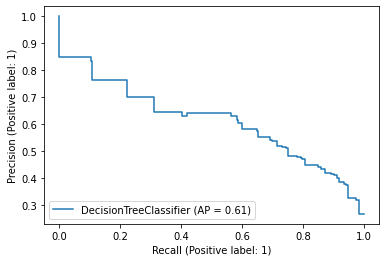

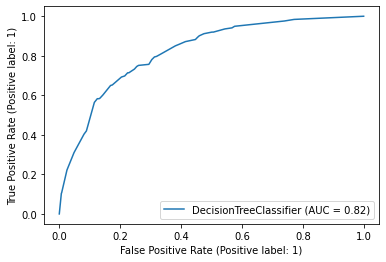

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.



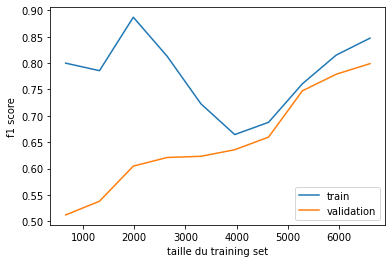

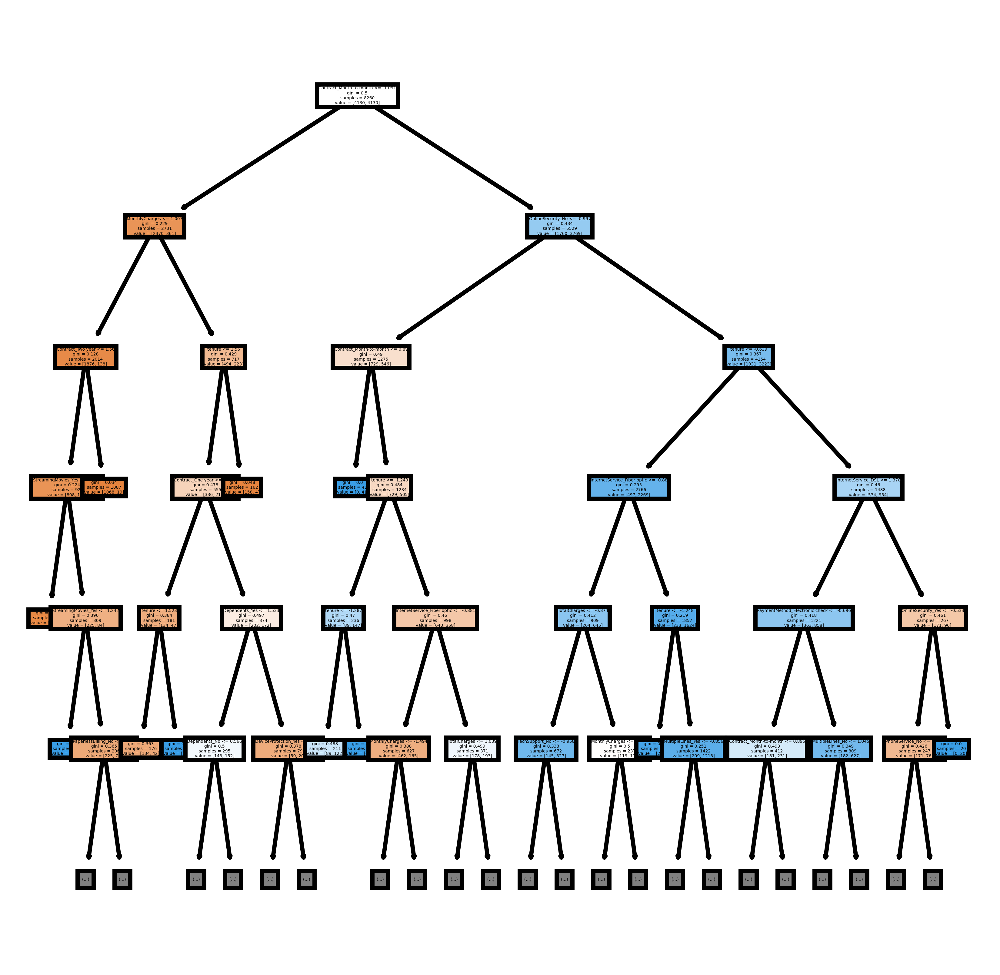

In [ ]:
tree_postpruned_smote=grid.best_estimator_
print("Depth: ",tree_postpruned.get_depth())
telecom_churn_pediction_tree(tree_postpruned_smote,X_train_smote,y_train_smote,X_test,y_test,cv=StratifiedKFold(n_splits=5))
plt.figure(figsize=(4,4),dpi=1000)
plot_tree(tree_postpruned_smote,
          feature_names=X.columns.values,
          filled=True,
          max_depth=5)
plt.show()

**Random Forest with smote**:

Model recall score on train data: 0.86
Model f1-score on train data: 0.85
              precision    recall  f1-score   support

           0       0.85      0.86      0.85      1033
           1       0.60      0.59      0.60       374

    accuracy                           0.79      1407
   macro avg       0.73      0.72      0.73      1407
weighted avg       0.79      0.79      0.79      1407

Model roc auc score using test data: 0.72


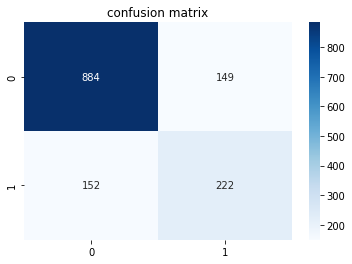

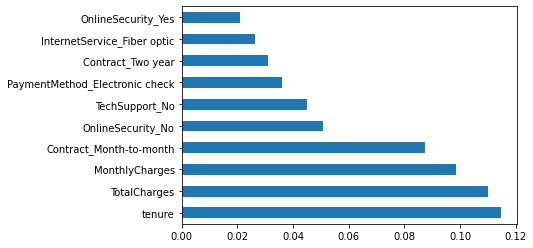

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



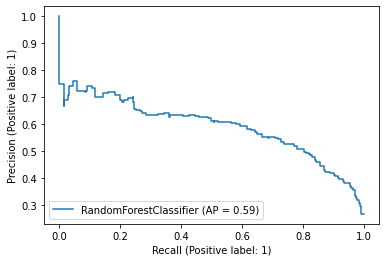

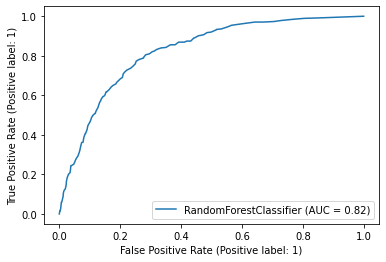

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.



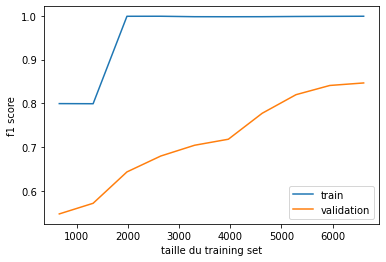

In [ ]:
random_forest_smote=RandomForestClassifier()
telecom_churn_pediction_tree(random_forest_smote,X_train_smote,y_train_smote,X_test,y_test,cv=StratifiedKFold(n_splits=5))

In [ ]:
models={
        "Logistic_regression":logistic_regression,
        "decision_tree":full_tree,
        "decision_tree_prepruned":tree_prepruned,
        "decision_tree_postpruned":tree_postpruned,
        "random_forest":random_forest,
}
models_smote={
    "Logistic_regression(SMOTE)":logistic_regression_smote,
    "decision_tree(SMOTE)":full_tree_smote,
    "decision_tree_prepruned(SMOTE)":tree_prepruned_smote,
    "decision_tree_postpruned(SMOTE)":tree_postpruned_smote,
    "random_forest(SMOTE)":random_forest_smote
}

In [ ]:
def model_report(element,X_train,y_train,X_test,y_test):
    name,model=element
    model.fit(X_train,y_train)
    y_predicted=model.predict(X_test)
    accuracy=round(accuracy_score(y_test,y_predicted),2)
    precision=round(precision_score(y_test,y_predicted,average='macro'),2)
    recall=round(recall_score(y_test,y_predicted,average='macro'),2)
    f1=round(f1_score(y_test,y_predicted,average='macro'),2)
    roc_auc=round(roc_auc_score(y_test,y_predicted),2)
    recall_churn_class=round(recall_score(y_test,y_predicted,average='binary',pos_label=1),2)
    precision_churn_class=round(precision_score(y_test,y_predicted,average='binary',pos_label=1),2)
    f1_churn_class=round(f1_score(y_test,y_predicted,average='binary',pos_label=1),2)
    return {
        "model_name":name,
        "model_accuracy":accuracy,
        "model_precision":precision,
        "model_recall":recall,
        "model_f1_score":f1,
        "model_roc_auc":roc_auc,
        "class_churn_precision":precision_churn_class,
        "class_churn_recall":recall_churn_class,
        "class_churn_f1":f1_churn_class
    }

In [ ]:
models_report=[]
for element in models.items():
    models_report.append(model_report(element,X_train,y_train,X_test,y_test))

In [ ]:
for element in models_smote.items():
     models_report.append(model_report(element,X_train_smote,y_train_smote,X_test,y_test))

In [ ]:
models_report_dataframe=pd.DataFrame(models_report)
models_report_dataframe=models_report_dataframe.set_index('model_name')


In [ ]:
models_report_dataframe

,model_accuracy,model_precision,model_recall,model_f1_score,model_roc_auc,class_churn_precision,class_churn_recall,class_churn_f1
model_name,,,,,,,,
Logistic_regression,0.81,0.77,0.73,0.75,0.73,0.68,0.56,0.62
decision_tree,0.72,0.64,0.65,0.64,0.65,0.47,0.49,0.48
decision_tree_prepruned,0.76,0.69,0.68,0.68,0.68,0.56,0.49,0.52
decision_tree_postpruned,0.78,0.71,0.68,0.69,0.68,0.60,0.48,0.53
random_forest,0.78,0.72,0.69,0.70,0.69,0.62,0.50,0.55
Logistic_regression(SMOTE),0.77,0.73,0.78,0.74,0.78,0.54,0.82,0.65
decision_tree(SMOTE),0.72,0.65,0.66,0.65,0.66,0.47,0.53,0.50
decision_tree_prepruned(SMOTE),0.74,0.69,0.72,0.69,0.72,0.50,0.68,0.58
decision_tree_postpruned(SMOTE),0.76,0.71,0.74,0.72,0.74,0.53,0.71,0.61


In [ ]:
def output_tracer(df, metric, color):
    tracer = go.Bar(y = df.index,
                    x = df[metric],
                    orientation = "h", name = metric ,
                    marker = dict(line = dict(width =.7), color = color)
                   )
    return tracer

def modelmetricsplot(df, title):
    layout = go.Layout(dict(title = title,
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric value",
                                     zerolinewidth=1,
                                     ticklen=5, gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )
    trace1 = output_tracer(df, "model_accuracy", "#6699FF")
    trace2 = output_tracer(df, 'model_precision', "red")
    trace3 = output_tracer(df, 'model_recall', "#33CC99")
    trace4 = output_tracer(df, 'model_f1_score', "lightgrey")
    trace5 = output_tracer(df, 'model_roc_auc', "magenta")
    trace6 = output_tracer(df, 'class_churn_precision', "#FFCC99")
    trace7 = output_tracer(df, 'class_churn_recall', "black")
    trace8= output_tracer(df, 'class_churn_f1', "brown")

    data = [trace1, trace2, trace3, trace4, trace5, trace6,trace7,trace8]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)


In [ ]:
modelmetricsplot(df=models_report_dataframe, title="Model performance using different metrics")